<a href="https://colab.research.google.com/github/yaelsh66/StyleGAN/blob/main/Copy_of_StyleGAN_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import grad
import torch.nn.functional as F
import kagglehub
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import numpy as np
import random
from tqdm import tqdm
from time import time, sleep
import pickle
import csv
import pandas as pd

Download 'kagglehub' if needed

In [ ]:
# !pip install --upgrade kagglehub

# Get the Data

In [ ]:
# Get the FFHQ dataset
path = kagglehub.dataset_download("arnaud58/flickrfaceshq-dataset-ffhq")

print("Path to dataset files:", path)

100%|██████████| 19.5G/19.5G [15:08<00:00, 23.0MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/arnaud58/flickrfaceshq-dataset-ffhq/versions/1


In [ ]:
# Define the transformation pipeline
transform = transforms.Compose([
  transforms.Resize(128),
  transforms.ToTensor(),  # Convert image to tensor
  transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),  # Normalize to [-1, 1]
])

In [ ]:
# Convert the dataset
class CustomImageDataset(Dataset):
  def __init__(self, image_dir, transform=None):
    self.image_dir = image_dir
    self.image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')]  # Adjust extensions if needed
    self.transform = transform

  def __len__(self):
    return len(self.image_paths)

  def __getitem__(self, idx):
    img_path = self.image_paths[idx]
    image = Image.open(img_path).convert('RGB')  # Open image in RGB mode

    if self.transform:
      image = self.transform(image)

    return image

# Load the custom dataset
dataset = CustomImageDataset(image_dir=path, transform=transform)

# Create DataLoader
train_loader = DataLoader(dataset, batch_size=128, shuffle=True)

# Example: Check the first batch of images
for images in train_loader:
  print(images.shape)
  break


torch.Size([128, 3, 128, 128])


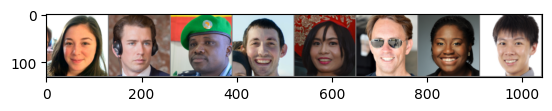

In [ ]:
# Function to display a batch of images
def imshow(img):
  img = img / 2 + 0.5  # Unnormalize (if needed)
  np_img = img.numpy()
  plt.imshow(np.transpose(np_img, (1, 2, 0)))  # Convert to HWC for display
  plt.show()

# Visualize the first batch of images
data_iter = iter(train_loader)
images = next(data_iter)

# Show a grid of images
imshow(vutils.make_grid(images[:8]))  # Display the first 8 images in the batch

# The Architecture

## The Mapping Network

In [ ]:
class MappingNetwork(nn.Module):
  """
  The Mapping Network transforms a latent vector z (in Z space)
  into a latent vector w (in W space).
  """
  def __init__(self, z_dim=128, w_dim=128, num_layers=8, lr_multiplier=0.002):
    """
    Args:
      z_dim (int): Dimensionality of the input latent vector z.
      w_dim (int): Dimensionality of the output latent vector w.
      num_layers (int): Number of fully connected layers in the mapping network (from the paper).
      lr_multiplier (float): Learning rate multiplier for weights and biases.
    """
    super(MappingNetwork, self).__init__()

    self.z_dim = z_dim
    self.w_dim = w_dim
    self.num_layers = num_layers
    self.lr_multiplier = lr_multiplier

    # Define the fully connected layers
    layers = []
    for _ in range(num_layers):
      layers.append(nn.Linear(z_dim, w_dim))
      layers.append(nn.LeakyReLU(negative_slope=0.2, inplace=True))
    self.mapping = nn.Sequential(*layers)

    # Initialize weights with a scaled-down variance for stability
    self._initialize_weights()

  def _initialize_weights(self):
    """
    Custom weight initialization as per the StyleGAN paper:
    - Normal distribution with scaled variance.
    """

    for layer in self.mapping:
        if isinstance(layer, nn.Linear):
            nn.init.normal_(layer.weight, mean=0.0, std=1.0)
            nn.init.constant_(layer.bias, 0.0)
            layer.weight.data *= self.lr_multiplier


  def forward(self, z):
    """
    Forward pass through the mapping network.

    Args:
        z (torch.Tensor): Input latent vector of shape (batch_size, z_dim).

    Returns:
        torch.Tensor: Output latent vector w of shape (batch_size, w_dim).
    """
    # Normalize input latent vector z for better performance
    z = F.normalize(z, dim=1)
    w = self.mapping(z)

    return w


## AdaIN (Adaptive Instance Normalization)

In [ ]:
class AdaIN(nn.Module):
  """
  Adaptive Instance Normalization (AdaIN).

  """

  def __init__(self, epsilon=1e-8):
    super(AdaIN, self).__init__()
    self.epsilon = epsilon  # Small constant to prevent division by zero

  def forward(self, x, style):
    """
      Applies Adaptive Instance Normalization.

      Args:
        x (torch.Tensor): Input feature map.
                          Shape: (B, C, H, W)
        style (torch.Tensor): Style vector containing scale and bias.
                              Shape: (B, 2C)

      Returns:
        torch.Tensor: Transformed feature map after AdaIN.
                      Shape: (B, C, H, W)
    """
    batch_size, channels, height, width = x.shape  # (B, C, H, W)

    # Compute mean and standard deviation of input feature map
    mean_x = x.mean(dim=[2, 3], keepdim=True)  # (B, C, 1, 1)
    std_x = x.std(dim=[2, 3], keepdim=True) + self.epsilon  # (B, C, 1, 1)

    # Normalize feature map
    normalized_x = (x - mean_x) / std_x  # (B, C, H, W)

    # Extract style parameters (scale and bias)
    y_s, y_b = style.chunk(2, dim=1)  # Splits (B, 2C) into two tensors of (B, C)
    # print(f"**AdaIN** y_s shape: {y_s.shape}, y_b shape: {y_b.shape}")
    # Reshape for broadcasting
    # print(f"**AdaIN** batch_size: {batch_size}, channels: {channels}")
    y_s = y_s.view(batch_size, channels, 1, 1)  # (B, C, 1, 1)
    y_b = y_b.view(batch_size, channels, 1, 1)  # (B, C, 1, 1)

    # Apply learned affine transformation (scale and shift)
    return y_s * normalized_x + y_b  # (B, C, H, W)


In [ ]:
class NoiseInjection(nn.Module):
  """Adds noise to the feature maps"""
  def __init__(self, channels):
    super(NoiseInjection, self).__init__()
    self.weight = nn.Parameter(torch.zeros(1, channels, 1, 1))

  def forward(self, x):
    noise = torch.randn(x.shape[0], 1, x.shape[2], x.shape[3], device=x.device)
    return x + self.weight * noise


## The Synthesis Network

StyleGAN’s synthesis network. It consists of:

Upsampling (if not the first block) to increase the resolution.
Convolutional layers to refine feature maps.
Adding noise for fine detail variation.
LeakyReLU for non-linearity.
Adaptive Instance Normalization (AdaIN), where the latent vector w is first transformed via a learned affine transformation to generate style-specific scale and bias parameters, which are then applied to the normalize feature maps.


### The Synthesis Block

**Consists of:**
1. Upsampling (if not the first block) to increase the resolution.
2. Convolutional layers to refine feature maps.
3. Adding noise for fine detail variation.
4. LeakyReLU for non-linearity.
5. Adaptive Instance Normalization (AdaIN), where the latent vector w is first transformed via a learned affine transformation to generate style-specific scale and bias parameters, which are then applied to the normalize feature maps.

In [ ]:
class SynthesisBlock(nn.Module):
  """Single block in the Synthesis Network"""
  def __init__(self, in_channels, out_channels):
    super(SynthesisBlock, self).__init__()
    self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
    self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
    self.noise1 = NoiseInjection(out_channels)
    self.noise2 = NoiseInjection(out_channels)
    self.adain1 = AdaIN()
    self.adain2 = AdaIN()
    self.lrelu = nn.LeakyReLU(0.2)

  def forward(self, x, style):
    if x.shape[3] > 4:
      x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)  # Upsample

    # print(f"**SynthesisBlock1** x shape: {x.shape}")
    x = self.conv1(x)
    # print(f"**SynthesisBlock2** x shape: {x.shape}")
    x = self.noise1(x)
    # print(f"**SynthesisBlock3** x shape: {x.shape}")
    x = self.lrelu(x)
    # print(f"**SynthesisBlock4** x shape: {x.shape}")
    x = self.adain1(x, style)

    x = self.conv2(x)
    x = self.noise2(x)
    x = self.lrelu(x)
    x = self.adain2(x, style)
    if x.shape[3] == 4:
      x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)  # Upsample

    return x



### The Synthesis Network (itself)

* The SynthesisNetwork in StyleGAN is responsible for **generating an image** by **progressively refining** it through multiple SynthesisBlocks, each corresponding to a different resolution.
* It takes the latent vector w (mapped from the input noise via the MappingNetwork) and passes it through a **series of blocks**, applying upsampling, convolution, noise injection, LeakyReLU, and AdaIN to gradually refine the image's details.
* The **to_rgb layer** is used at each block to **convert** the feature map **into an RGB image**, with the results being progressively combined by upsampling and adding the RGB outputs from each block, ultimately producing a high-resolution image with fine details and realistic appearance.

In [ ]:
class SynthesisNetwork(nn.Module):
  """Generates images from W-space latent vector"""
  def __init__(self, w_dim, max_resolution=128):
    super(SynthesisNetwork, self).__init__()
    self.init_constant = nn.Parameter(torch.randn(1, 2*w_dim, 4, 4))  # Learned 4x4 feature map
    self.blocks = nn.ModuleList()
    self.to_rgb_layers = nn.ModuleList()
    self.affine_layers = nn.ModuleList()
    resolution = 4
    channels = 2*w_dim

    while resolution < max_resolution:
      out_channels = max(channels // 2, 8)  # Reduce channels as resolution increases
      self.affine_layers.append(nn.Linear(w_dim, channels))
      self.blocks.append(SynthesisBlock(channels, out_channels))
      self.to_rgb_layers.append(nn.Conv2d(out_channels, 3, kernel_size=1))
      resolution *= 2
      channels = out_channels

  def forward(self, w):
    batch_size = w.shape[0]
    x = self.init_constant.repeat(batch_size, 1, 1, 1)
    rgb = None
    for i, (block, to_rgb) in enumerate(zip(self.blocks, self.to_rgb_layers)):
      style = self.affine_layers[i](w)
      # print(f"**SynthesisNetwork**i: {i} Style shape: {style.shape}, x shap: {x.shape}")
      x = block(x, style)
      # print(f"**SynthesisNetwork** x shape aftre block: {x.shape}")
      rgb = to_rgb(x) if rgb is None else F.interpolate(rgb, scale_factor=2, mode='bilinear', align_corners=False) + to_rgb(x)

    return torch.tanh(rgb)  # Normalize output to [-1, 1] range


## The Generator

The Generator is the **combination** of the **Mapping Network** with the **Synthesis Network**

In [ ]:
class Generator(nn.Module):
  """
  Generator combines the Mapping Network and Synthesis Network.
  """
  def __init__(self, z_dim=128, w_dim=128, resolution=128):
    """
    Args:
      z_dim (int): Dimensionality of the input latent vector z.
      w_dim (int): Dimensionality of the intermediate latent vector w.
      resolution (int): Output image resolution (e.g., 128 for 128*128 images).
    """
    super(Generator, self).__init__()
    self.mapping_network = MappingNetwork(z_dim=z_dim, w_dim=w_dim)
    self.synthesis_network = SynthesisNetwork(
        w_dim=w_dim, max_resolution=resolution
    )

  def forward(self, z):
    """
    Args:
      z (torch.Tensor): Input latent vector of shape (batch_size, z_dim).

    Returns:
      torch.Tensor: Generated image of shape (batch_size, num_channels, resolution, resolution).
    """
    # Transform z into w using the Mapping Network
    w = self.mapping_network(z)
    # w2 = self.mapping_network(z2)

    # Generate image from w using the Synthesis Network
    img = self.synthesis_network(w)
    return img

## The Discriminator

### The Discriminator Block

The Discriminator block is in charge of the convolutional and downsanpling for each level.

In [ ]:
class DiscriminatorBlock(nn.Module):
  """
  A single block in the Discriminator, with convolution and downsampling.
  """
  def __init__(self, in_channels, out_channels):
    """
    Args:
      in_channels (int): Number of input channels.
      out_channels (int): Number of output channels.
    """
    super(DiscriminatorBlock, self).__init__()
    self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
    self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
    self.downsample = nn.AvgPool2d(kernel_size=2)

  def forward(self, x):
    """
    Args:
      x (torch.Tensor): Input tensor of shape (batch_size, in_channels, height, width).

    Returns:
      torch.Tensor: Output tensor after convolution and downsampling.
    """
    # print(f"Input shapeBlock: {x.shape}")
    x = F.leaky_relu(self.conv1(x), negative_slope=0.2)
    x = F.leaky_relu(self.conv2(x), negative_slope=0.2)
    x = self.downsample(x)
    return x


### The Discriminator (itself)

In [ ]:
class Discriminator(nn.Module):
  """
  Discriminator for the GAN, which distinguishes real from generated images.
  """
  def __init__(self, resolution=128, num_channels=3, fmap_base=128):
    """
    Args:
      resolution (int): Input image resolution (e.g., 128 for 128x128 images).
      num_channels (int): Number of input channels (e.g., 3 for RGB).
      fmap_base (int): Controls the number of feature maps in the network.
    """
    super(Discriminator, self).__init__()

    # Compute the number of layers based on resolution
    self.num_blocks = int(int(resolution / 4).bit_length() * 2)  # Two layers per resolution
    self.blocks = nn.ModuleList()

    # Initial convolutional block for high resolution
    in_fmaps = num_channels
    out_fmaps = fmap_base
    self.blocks.append(DiscriminatorBlock(in_fmaps, out_fmaps))

    # Progressive downsampling blocks
    for i in range(1, self.num_blocks // 2):
      in_fmaps = fmap_base // (2 ** (i - 1))
      out_fmaps = max(fmap_base // (2 ** i), 8)
      self.blocks.append(DiscriminatorBlock(in_fmaps, out_fmaps))

    # Final dense layer
    self.fc = nn.Linear(out_fmaps * (resolution // (2 ** (self.num_blocks // 2))) ** 2, 1)

  def forward(self, x):
    """
    Args:
      x (torch.Tensor): Input image of shape (batch_size, num_channels, resolution, resolution).

    Returns:
      torch.Tensor: Discriminator output (real/fake score).
    """
    for block in self.blocks:
      x = block(x)

    x = x.view(x.size(0), -1)  # Flatten
    x = self.fc(x)
    return x

## GANLoss

The GANLoss class defines the loss function used for training the GAN.

It has 2 parts:

* **Discriminator Loss** (D_loss):

The discriminator's objective is to correctly classify real and fake images.

*D_loss_real:* The loss when the discriminator classifies real images as real (using binary_cross_entropy_with_logits).

*D_loss_fake:* The loss when the discriminator classifies fake images as fake.
The total discriminator loss, D_loss, is the average of these two losses: (D_loss_real + D_loss_fake) / 2.

* **Generator Loss** (G_loss):

The generator's goal is to fool the discriminator into classifying fake images as real.

*G_loss:* This is the binary cross-entropy loss between the discriminator's output for fake images and a label of 1 (real), as the generator tries to "trick" the discriminator.

In [ ]:
class GANLoss(nn.Module):
  def __init__(self, device):
    super(GANLoss, self).__init__()
    self.device = device

  def forward(self, real_output, fake_output):
    batch_size = real_output.size(0)  # Get the batch size

    # Create real and fake labels with the correct shape
    real_label = torch.ones(batch_size, 1).to(self.device)  # Shape: [batch_size, 1]
    fake_label = torch.zeros(batch_size, 1).to(self.device) # Shape: [batch_size, 1]

    # Discriminator loss
    D_loss_real = F.binary_cross_entropy_with_logits(real_output, real_label)
    D_loss_fake = F.binary_cross_entropy_with_logits(fake_output, fake_label)

    # Total discriminator loss
    D_loss = (D_loss_real + D_loss_fake) / 2

    # Generator loss
    G_loss = F.binary_cross_entropy_with_logits(fake_output, real_label)  # Generator tries to fool D

    return D_loss, G_loss


### Path Length Regularization

To **improve the stability of the generator**, path length regularization is applied. This regularization **penalizes excessive variations** in the generator’s output with respect to small changes in the latent vector z.

The process involves:

1. Computing the gradient of the generated image with respect to the latent vector z.
2. Calculating the path length, which is the L2 norm of these gradients, representing the sensitivity of the generated image to changes in z.
3. The regularization loss is computed as the squared difference between the path length and 1.0, scaled by a factor alpha. This encourages smoother and more stable variations in the generated images, promoting better generalization.
4. This regularization loss is added to the generator’s overall loss, helping to prevent the generator from making drastic, unstable changes to its output based on minor changes in z.

In [ ]:
def path_length_regularization(generator, z, alpha=0.1):
  z.requires_grad = True
  generated_image = generator(z)
  grads = torch.autograd.grad(outputs=generated_image, inputs=z, grad_outputs=torch.ones_like(generated_image), create_graph=True)[0]

  path_length = torch.norm(grads, p=2, dim=1).mean()

  reg_loss = alpha * (path_length - 1.0) ** 2

  return reg_loss

# Savings

Connect to Google Drive

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


Save and load the Global Epoch number

In [ ]:
# Keep track of how many epochs learned by now
def save_epoch_num(value, path="/content/drive/My Drive/StyleGANPrivate Models/epochs_trained.pkl"):
  with open(path, "wb") as f:
    pickle.dump(value, f)

def load_epoch_num(path="/content/drive/My Drive/StyleGANPrivate Models/epochs_trained.pkl"):
  if os.path.exists(path):
    with open(path, "rb") as f:
      return pickle.load(f)
  return 0  # Default start value

epochs_trained = load_epoch_num()
print(f"Epochs Trained: {epochs_trained}")

Epochs Trained: 155


Save the losses (G_loss & D_loss) in a csv file

In [ ]:
# Keep track on the losses
def save_losses(losses, path="/content/drive/My Drive/StyleGANPrivate Models/new_gan_losses.csv"):
  """Saves accumulated losses to the CSV file and clears the lists."""
  # Check if lists are not empty
  if losses:
    with open(path, "a", newline="") as f:
      writer = csv.writer(f)

      # Write each loss pair
      for loss in losses:
        # Format: ['epoch', 'batch', 'G_loss', 'D_loss']
        writer.writerow([loss[0], loss[1], loss[2], loss[3]])

Show images

In [ ]:
# Function to show images
def show_images(images, title="Images", num_images=1):
  images = images[:num_images]  # Limit to first 'num_images' images for visualization
  images = images.cpu().detach().numpy()  # Move to CPU and convert to numpy
  images = np.transpose(images, (0, 2, 3, 1))  # Convert to (batch, height, width, channels)
  # Rescale images to [0, 1]
  images = (images + 1) / 2

  fig, axes = plt.subplots(1, num_images, figsize=(15, 15))
  for ax, img in zip(axes, images):
    ax.imshow(img)
    ax.axis('off')
  plt.show()

# Training

In [ ]:
torch.cuda.empty_cache()

## Instantiate the model and choose Hyperparameters

In [ ]:
# Instantiate Generator and Discriminator
generator = Generator()
discriminator = Discriminator()

# Hyperparameters
lr = 0.0002
batch_size = 32
num_epochs = 10
lambda_gp = 10  # Gradient Penalty Coefficient
z_dim=128
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Loss function (GANLoss)
criterion = GANLoss(device)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True)

## The Training Loop!!

Loaded existing models from Google Drive.
--------------------------------------------------
Start Training
--------------------------------------------------


Training images:   0%|          | 0/1625 [00:03<?, ?it/s]


Epoch [1/10], Step [0/1625], D Loss: 0.1035, G Loss: 3.7850


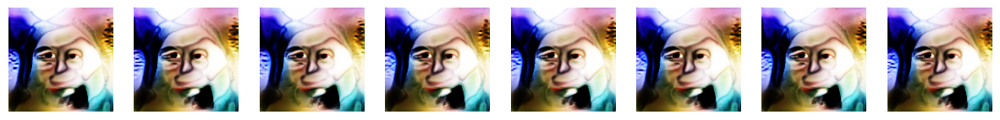

Training images:  18%|█▊        | 300/1625 [04:38<20:21,  1.08it/s]


Epoch [1/10], Step [300/1625], D Loss: 0.0580, G Loss: 3.5147


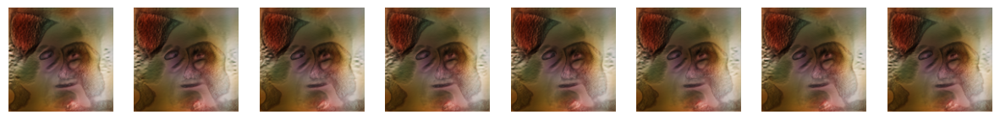

Training images:  37%|███▋      | 600/1625 [09:20<16:16,  1.05it/s]


Epoch [1/10], Step [600/1625], D Loss: 0.9920, G Loss: 2.5133


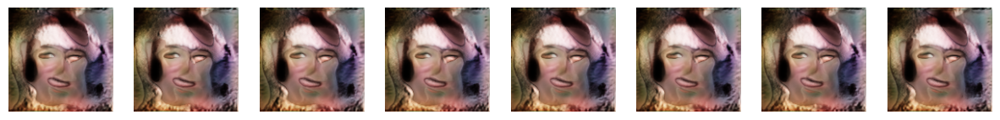

Training images:  55%|█████▌    | 900/1625 [13:59<11:22,  1.06it/s]


Epoch [1/10], Step [900/1625], D Loss: 0.4427, G Loss: 2.0218


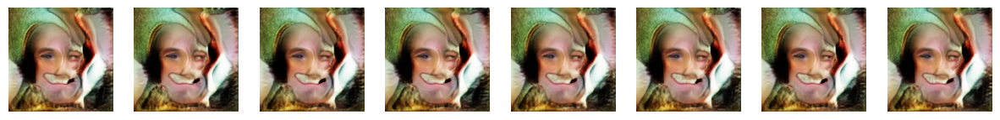

Training images:  74%|███████▍  | 1200/1625 [18:40<06:25,  1.10it/s]


Epoch [1/10], Step [1200/1625], D Loss: 0.0316, G Loss: 3.6619


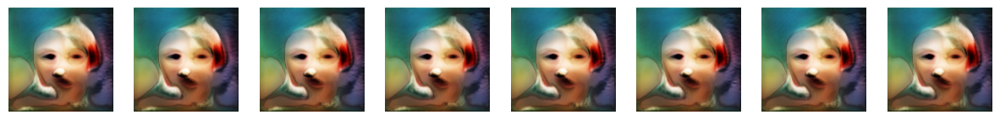

Training images:  92%|█████████▏| 1500/1625 [23:20<02:04,  1.01it/s]


Epoch [1/10], Step [1500/1625], D Loss: 0.4353, G Loss: 1.7591


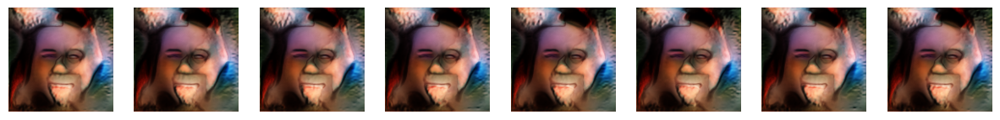

Training images: 100%|██████████| 1625/1625 [25:16<00:00,  1.07it/s]



Epoch [1/10], Step [1624/1625], D Loss: 0.1075, G Loss: 2.4158


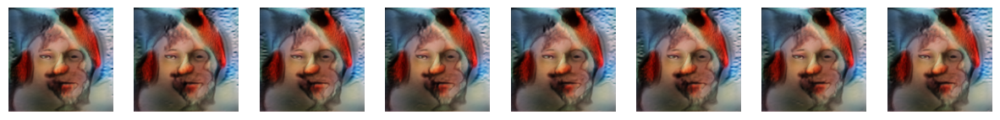


Models saved to Google Drive after local epoch 1

--------------------------------------------------
--------------------------------------------------
The model was trained over 156 epochs by now
--------------------------------------------------
--------------------------------------------------



Training images:   0%|          | 0/1625 [00:00<?, ?it/s]


Epoch [2/10], Step [0/1625], D Loss: 0.1509, G Loss: 2.2534


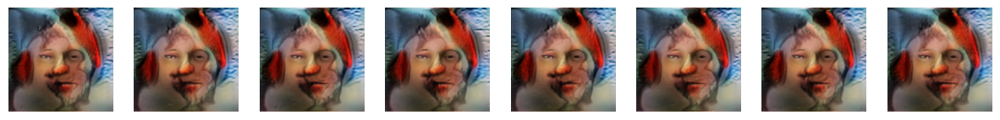

Training images:  18%|█▊        | 300/1625 [04:40<20:04,  1.10it/s]


Epoch [2/10], Step [300/1625], D Loss: 0.0166, G Loss: 3.8015


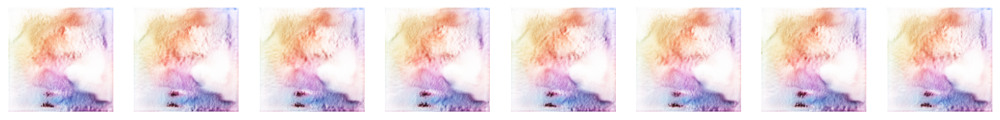

Training images:  37%|███▋      | 600/1625 [09:22<16:48,  1.02it/s]


Epoch [2/10], Step [600/1625], D Loss: 0.2085, G Loss: 2.1099


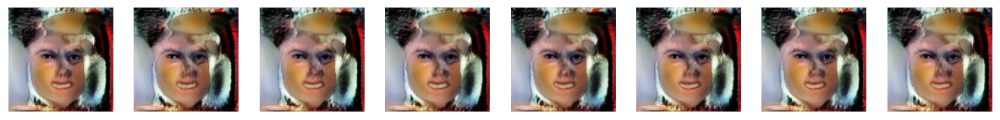

Training images:  55%|█████▌    | 900/1625 [14:04<11:10,  1.08it/s]


Epoch [2/10], Step [900/1625], D Loss: 0.4457, G Loss: 1.2893


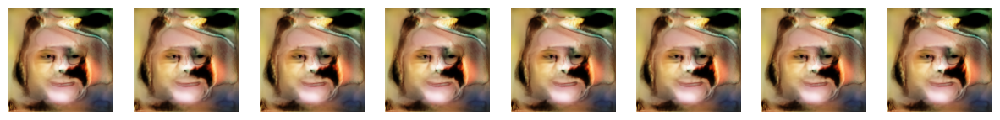

Training images:  74%|███████▍  | 1200/1625 [18:48<07:11,  1.02s/it]


Epoch [2/10], Step [1200/1625], D Loss: 0.3914, G Loss: 1.4177


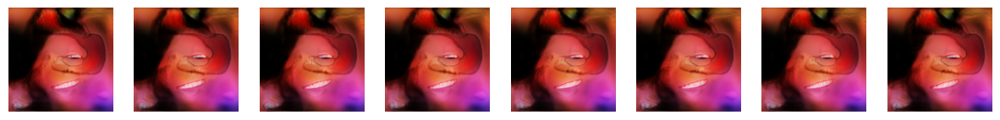

Training images:  92%|█████████▏| 1500/1625 [23:32<01:54,  1.09it/s]


Epoch [2/10], Step [1500/1625], D Loss: 0.1627, G Loss: 1.9619


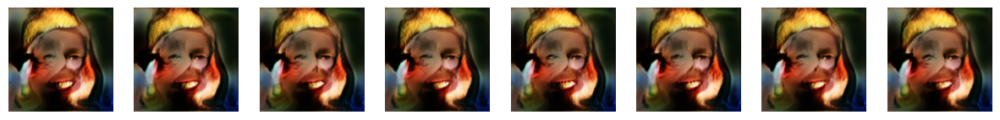

Training images: 100%|██████████| 1625/1625 [25:30<00:00,  1.06it/s]



Epoch [2/10], Step [1624/1625], D Loss: 0.2766, G Loss: 2.9919


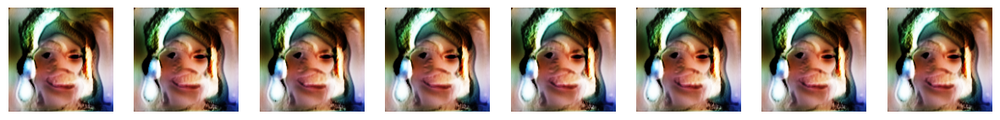


Models saved to Google Drive after local epoch 2

--------------------------------------------------
--------------------------------------------------
The model was trained over 157 epochs by now
--------------------------------------------------
--------------------------------------------------



Training images:   0%|          | 0/1625 [00:00<?, ?it/s]


Epoch [3/10], Step [0/1625], D Loss: 0.0857, G Loss: 2.8783


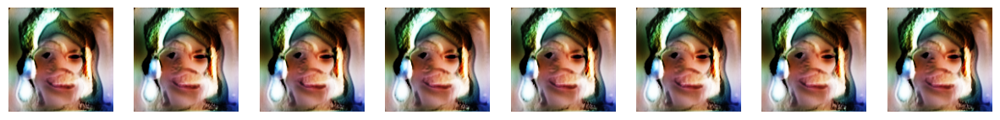

Training images:  18%|█▊        | 300/1625 [04:45<20:56,  1.05it/s]


Epoch [3/10], Step [300/1625], D Loss: 0.5180, G Loss: 1.1575


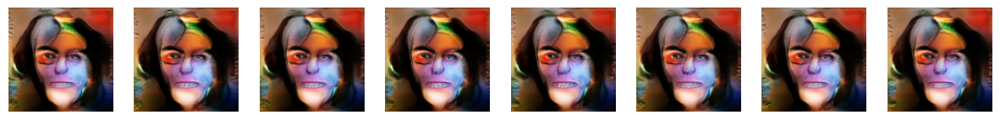

Training images:  37%|███▋      | 600/1625 [09:31<16:21,  1.04it/s]


Epoch [3/10], Step [600/1625], D Loss: 0.2664, G Loss: 1.8359


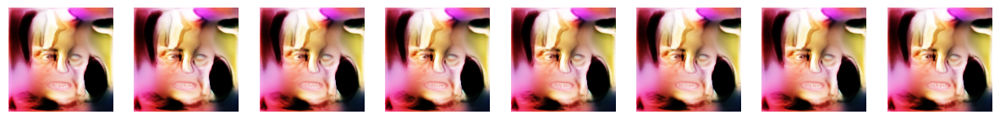

Training images:  55%|█████▌    | 900/1625 [14:18<11:06,  1.09it/s]


Epoch [3/10], Step [900/1625], D Loss: 0.3130, G Loss: 1.5408


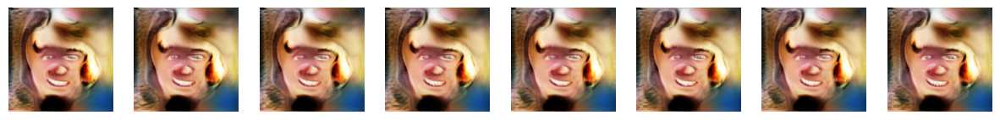

Training images:  74%|███████▍  | 1200/1625 [19:06<06:39,  1.06it/s]


Epoch [3/10], Step [1200/1625], D Loss: 0.1436, G Loss: 2.5250


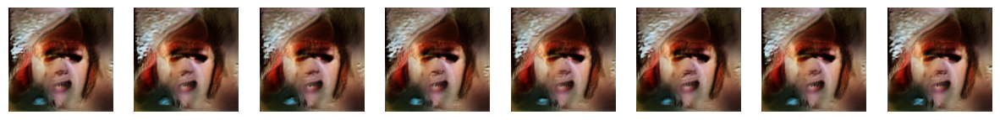

Training images:  92%|█████████▏| 1500/1625 [23:55<01:59,  1.05it/s]


Epoch [3/10], Step [1500/1625], D Loss: 0.2680, G Loss: 1.7778


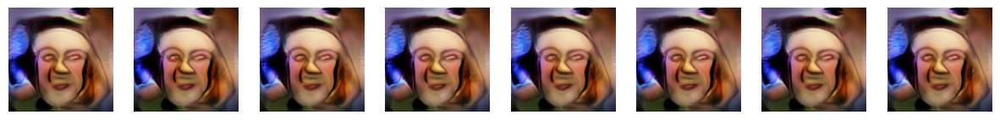

Training images: 100%|██████████| 1625/1625 [25:55<00:00,  1.04it/s]



Epoch [3/10], Step [1624/1625], D Loss: 0.6985, G Loss: 0.7317


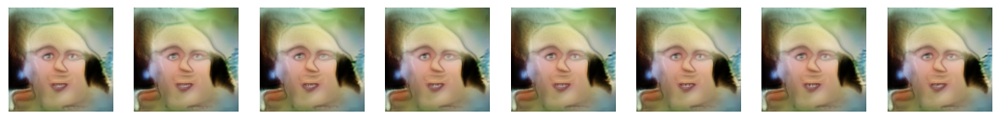


Models saved to Google Drive after local epoch 3

--------------------------------------------------
--------------------------------------------------
The model was trained over 158 epochs by now
--------------------------------------------------
--------------------------------------------------



Training images:   0%|          | 0/1625 [00:00<?, ?it/s]


Epoch [4/10], Step [0/1625], D Loss: 0.6784, G Loss: 0.8964


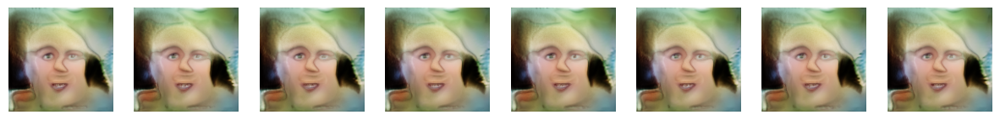

Training images:  18%|█▊        | 300/1625 [04:48<21:45,  1.02it/s]


Epoch [4/10], Step [300/1625], D Loss: 0.4308, G Loss: 1.3006


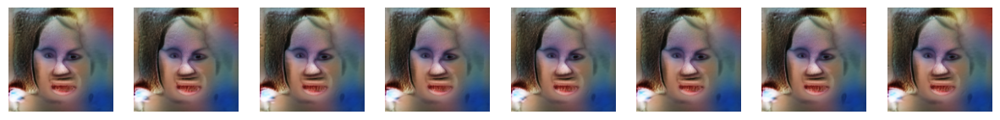

Training images:  37%|███▋      | 600/1625 [09:37<17:39,  1.03s/it]


Epoch [4/10], Step [600/1625], D Loss: 0.6315, G Loss: 1.0014


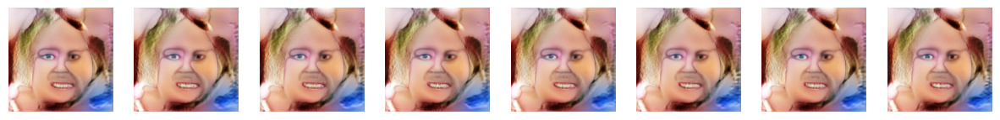

Training images:  55%|█████▌    | 900/1625 [14:31<12:22,  1.02s/it]


Epoch [4/10], Step [900/1625], D Loss: 0.4550, G Loss: 1.9445


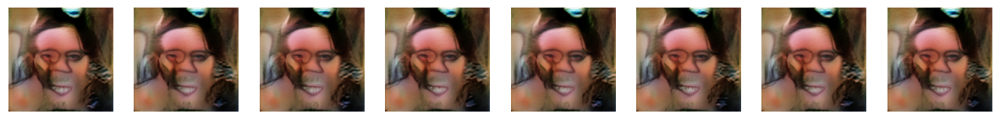

Training images:  74%|███████▍  | 1200/1625 [19:23<07:00,  1.01it/s]


Epoch [4/10], Step [1200/1625], D Loss: 0.1300, G Loss: 3.3886


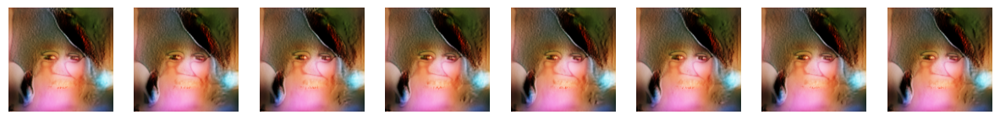

Training images:  92%|█████████▏| 1500/1625 [24:17<02:04,  1.00it/s]


Epoch [4/10], Step [1500/1625], D Loss: 0.5218, G Loss: 1.0790


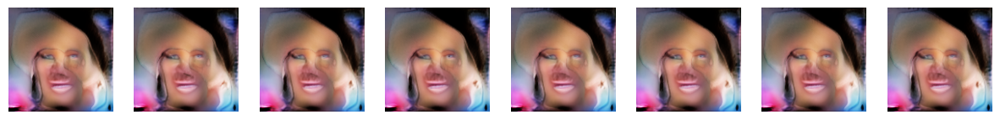

Training images: 100%|██████████| 1625/1625 [26:18<00:00,  1.03it/s]



Epoch [4/10], Step [1624/1625], D Loss: 0.2998, G Loss: 4.6796


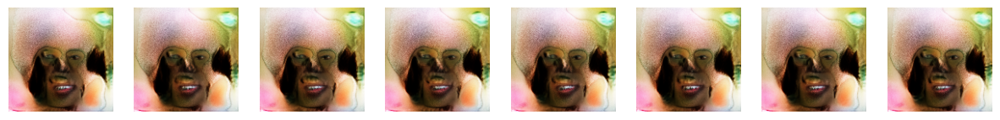


Models saved to Google Drive after local epoch 4

--------------------------------------------------
--------------------------------------------------
The model was trained over 159 epochs by now
--------------------------------------------------
--------------------------------------------------



Training images:   0%|          | 0/1625 [00:01<?, ?it/s]


Epoch [5/10], Step [0/1625], D Loss: 0.1868, G Loss: 4.0936


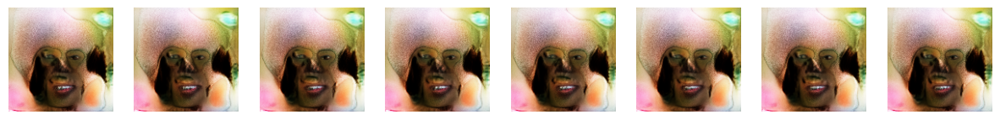

Training images:  18%|█▊        | 300/1625 [04:47<20:20,  1.09it/s]


Epoch [5/10], Step [300/1625], D Loss: 0.3525, G Loss: 1.5540


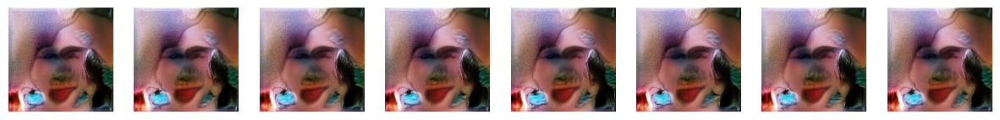

Training images:  37%|███▋      | 600/1625 [09:35<17:38,  1.03s/it]


Epoch [5/10], Step [600/1625], D Loss: 0.1592, G Loss: 2.8779


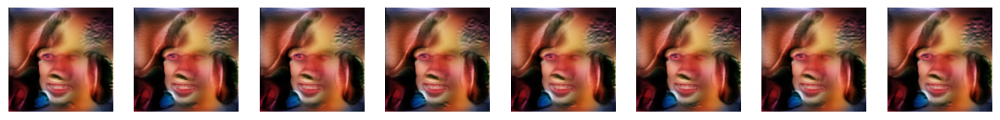

Training images:  55%|█████▌    | 900/1625 [14:21<11:10,  1.08it/s]


Epoch [5/10], Step [900/1625], D Loss: 0.3079, G Loss: 1.8270


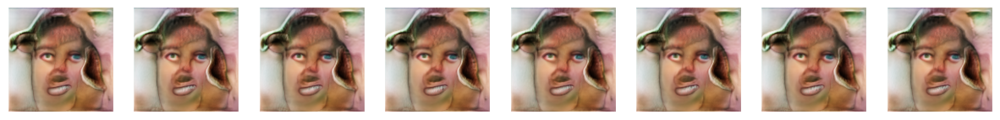

Training images:  74%|███████▍  | 1200/1625 [19:08<06:53,  1.03it/s]


Epoch [5/10], Step [1200/1625], D Loss: 0.3529, G Loss: 1.4666


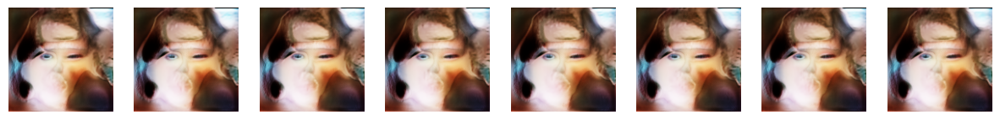

Training images:  92%|█████████▏| 1500/1625 [23:54<01:54,  1.09it/s]


Epoch [5/10], Step [1500/1625], D Loss: 0.5112, G Loss: 1.0435


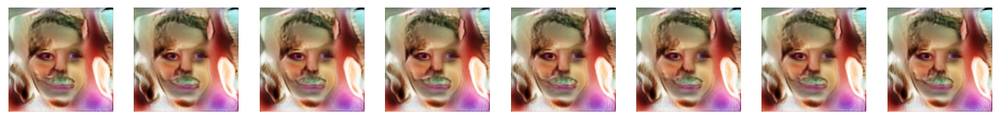

Training images: 100%|██████████| 1625/1625 [25:55<00:00,  1.04it/s]



Epoch [5/10], Step [1624/1625], D Loss: 0.6437, G Loss: 0.9691


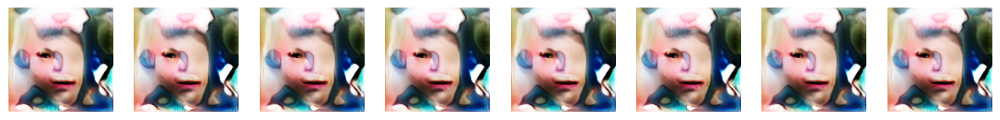


Models saved to Google Drive after local epoch 5

--------------------------------------------------
--------------------------------------------------
The model was trained over 160 epochs by now
--------------------------------------------------
--------------------------------------------------



Training images:   0%|          | 0/1625 [00:01<?, ?it/s]


Epoch [6/10], Step [0/1625], D Loss: 0.5406, G Loss: 1.0566


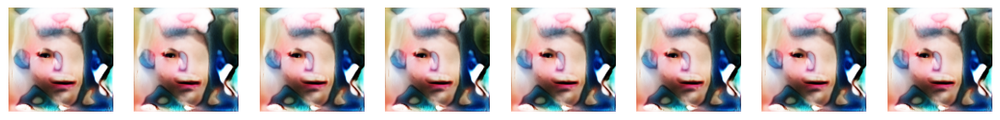

Training images:  18%|█▊        | 300/1625 [04:48<21:32,  1.03it/s]


Epoch [6/10], Step [300/1625], D Loss: 0.0674, G Loss: 3.9390


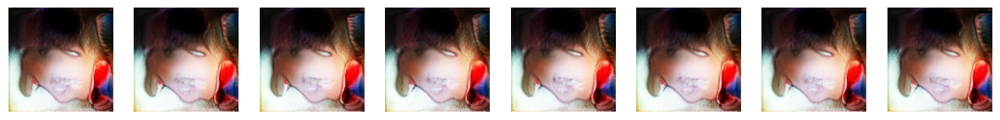

Training images:  37%|███▋      | 600/1625 [09:35<16:07,  1.06it/s]


Epoch [6/10], Step [600/1625], D Loss: 0.4152, G Loss: 2.3117


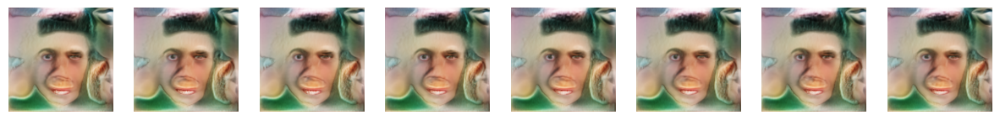

Training images:  55%|█████▌    | 900/1625 [14:25<11:25,  1.06it/s]


Epoch [6/10], Step [900/1625], D Loss: 0.4393, G Loss: 1.1350


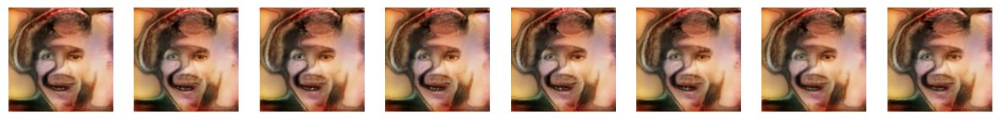

Training images:  74%|███████▍  | 1200/1625 [19:13<07:09,  1.01s/it]


Epoch [6/10], Step [1200/1625], D Loss: 0.1923, G Loss: 2.0166


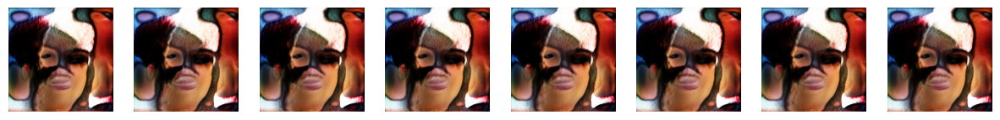

Training images:  92%|█████████▏| 1500/1625 [24:02<01:55,  1.08it/s]


Epoch [6/10], Step [1500/1625], D Loss: 0.3236, G Loss: 1.9841


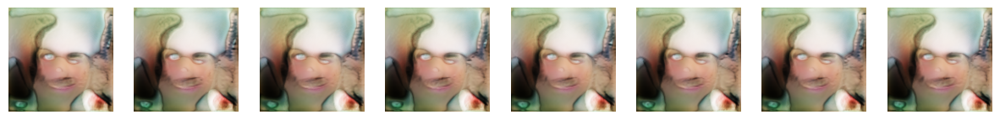

Training images: 100%|██████████| 1625/1625 [26:02<00:00,  1.04it/s]



Epoch [6/10], Step [1624/1625], D Loss: 0.4102, G Loss: 1.4352


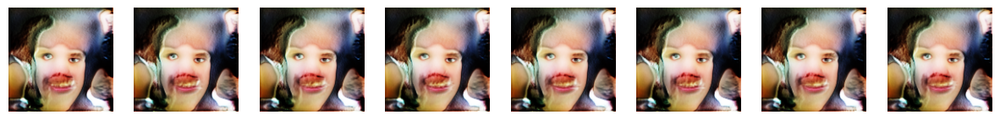


Models saved to Google Drive after local epoch 6

--------------------------------------------------
--------------------------------------------------
The model was trained over 161 epochs by now
--------------------------------------------------
--------------------------------------------------



Training images:   0%|          | 0/1625 [00:01<?, ?it/s]


Epoch [7/10], Step [0/1625], D Loss: 0.2746, G Loss: 2.4410


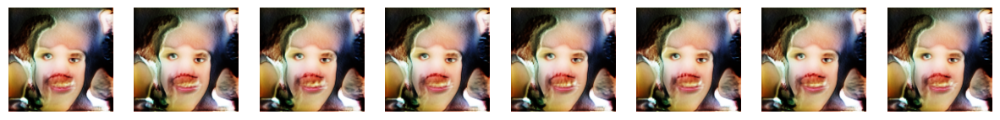

Training images:  18%|█▊        | 300/1625 [04:49<21:27,  1.03it/s]


Epoch [7/10], Step [300/1625], D Loss: 0.3664, G Loss: 1.6431


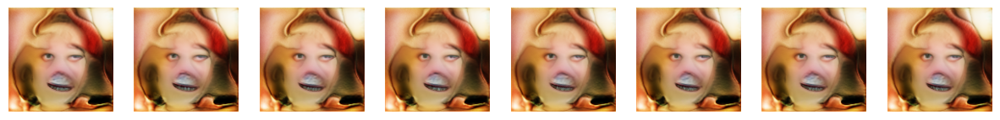

Training images:  37%|███▋      | 600/1625 [09:40<17:36,  1.03s/it]


Epoch [7/10], Step [600/1625], D Loss: 0.2751, G Loss: 1.8649


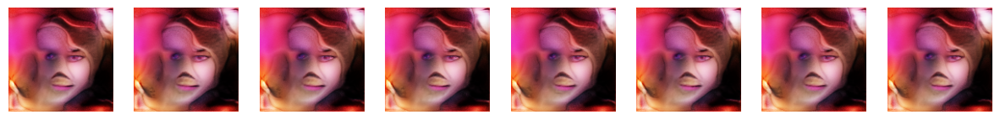

Training images:  55%|█████▌    | 900/1625 [14:30<11:14,  1.08it/s]


Epoch [7/10], Step [900/1625], D Loss: 0.1773, G Loss: 1.8750


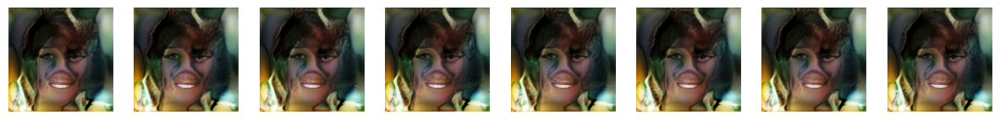

Training images:  74%|███████▍  | 1200/1625 [19:19<06:36,  1.07it/s]


Epoch [7/10], Step [1200/1625], D Loss: 0.2494, G Loss: 1.6800


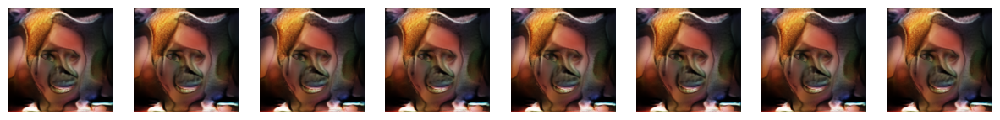

Training images:  92%|█████████▏| 1500/1625 [24:09<01:54,  1.09it/s]


Epoch [7/10], Step [1500/1625], D Loss: 0.0021, G Loss: 5.5009


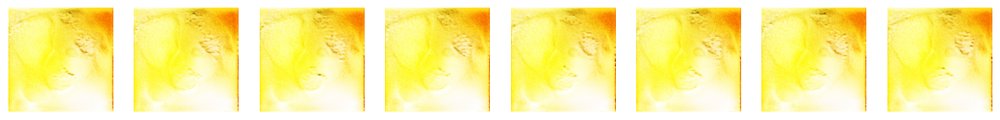

Training images: 100%|██████████| 1625/1625 [26:09<00:00,  1.04it/s]



Epoch [7/10], Step [1624/1625], D Loss: 0.0095, G Loss: 4.0507


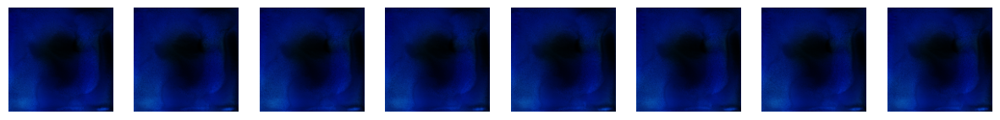


Models saved to Google Drive after local epoch 7

--------------------------------------------------
--------------------------------------------------
The model was trained over 162 epochs by now
--------------------------------------------------
--------------------------------------------------



Training images:   0%|          | 0/1625 [00:01<?, ?it/s]


Epoch [8/10], Step [0/1625], D Loss: 0.0089, G Loss: 4.1189


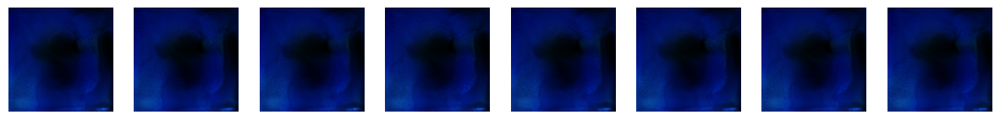

Training images:  18%|█▊        | 300/1625 [04:48<20:32,  1.07it/s]


Epoch [8/10], Step [300/1625], D Loss: 0.2422, G Loss: 1.7838


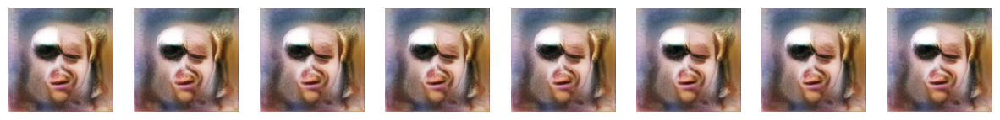

Training images:  37%|███▋      | 600/1625 [09:40<15:55,  1.07it/s]


Epoch [8/10], Step [600/1625], D Loss: 0.1450, G Loss: 2.1452


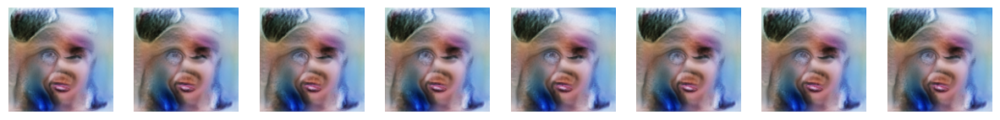

Training images:  55%|█████▌    | 900/1625 [14:34<12:14,  1.01s/it]


Epoch [8/10], Step [900/1625], D Loss: 0.2210, G Loss: 3.5524


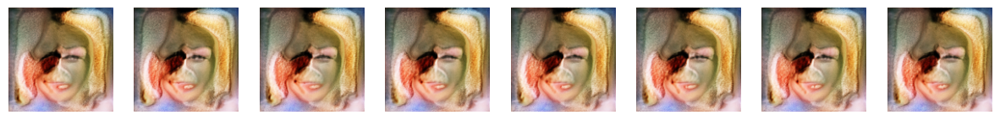

Training images:  74%|███████▍  | 1200/1625 [19:28<07:12,  1.02s/it]


Epoch [8/10], Step [1200/1625], D Loss: 0.2978, G Loss: 3.2764


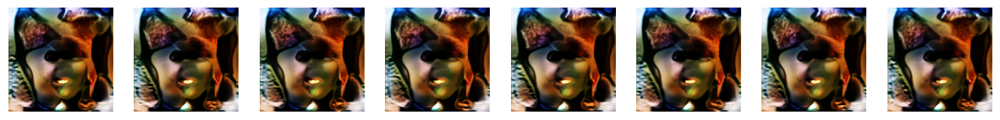

Training images:  92%|█████████▏| 1500/1625 [24:21<02:02,  1.02it/s]


Epoch [8/10], Step [1500/1625], D Loss: 0.3541, G Loss: 2.4597


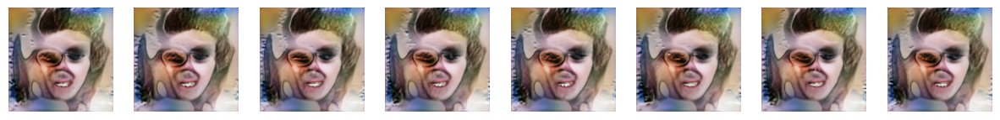

Training images: 100%|██████████| 1625/1625 [26:22<00:00,  1.03it/s]



Epoch [8/10], Step [1624/1625], D Loss: 0.1543, G Loss: 3.1048


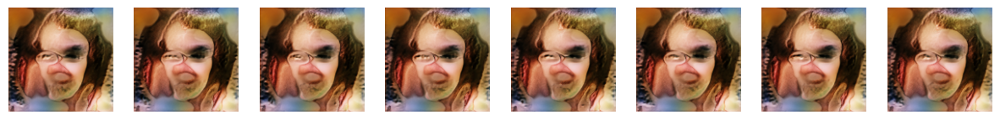


Models saved to Google Drive after local epoch 8

--------------------------------------------------
--------------------------------------------------
The model was trained over 163 epochs by now
--------------------------------------------------
--------------------------------------------------



Training images:   0%|          | 0/1625 [00:01<?, ?it/s]


Epoch [9/10], Step [0/1625], D Loss: 0.1318, G Loss: 2.7089


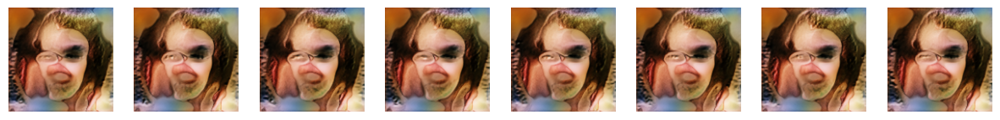

Training images:  18%|█▊        | 300/1625 [04:52<20:57,  1.05it/s]


Epoch [9/10], Step [300/1625], D Loss: 0.1433, G Loss: 2.4922


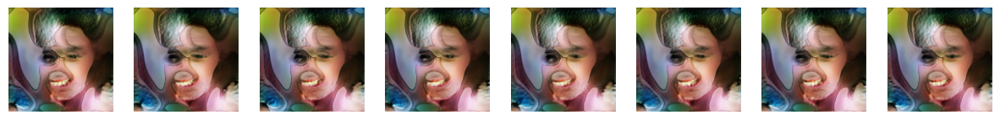

Training images:  37%|███▋      | 600/1625 [09:46<16:12,  1.05it/s]


Epoch [9/10], Step [600/1625], D Loss: 0.2839, G Loss: 1.6086


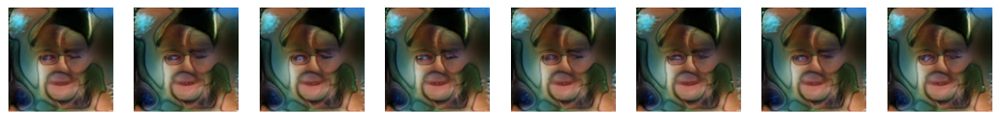

Training images:  55%|█████▌    | 900/1625 [14:41<11:58,  1.01it/s]


Epoch [9/10], Step [900/1625], D Loss: 0.0088, G Loss: 4.1497


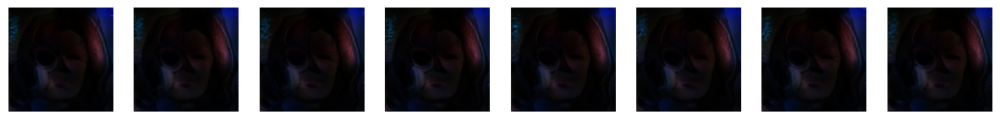

Training images:  74%|███████▍  | 1200/1625 [19:41<06:55,  1.02it/s]


Epoch [9/10], Step [1200/1625], D Loss: 0.4190, G Loss: 1.6407


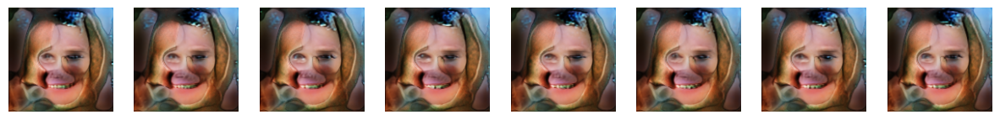

Training images:  92%|█████████▏| 1500/1625 [24:42<02:05,  1.00s/it]


Epoch [9/10], Step [1500/1625], D Loss: 0.3741, G Loss: 1.8712


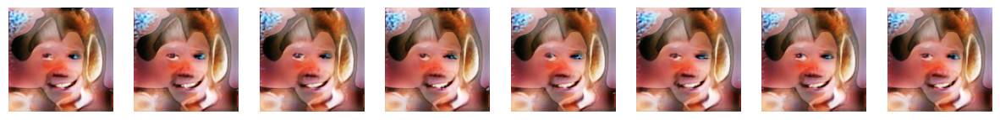

Training images: 100%|██████████| 1625/1625 [26:46<00:00,  1.01it/s]



Epoch [9/10], Step [1624/1625], D Loss: 0.6353, G Loss: 1.9620


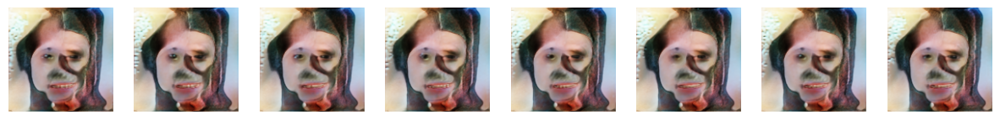


Models saved to Google Drive after local epoch 9

--------------------------------------------------
--------------------------------------------------
The model was trained over 164 epochs by now
--------------------------------------------------
--------------------------------------------------



Training images:   0%|          | 0/1625 [00:01<?, ?it/s]


Epoch [10/10], Step [0/1625], D Loss: 0.1951, G Loss: 2.1517


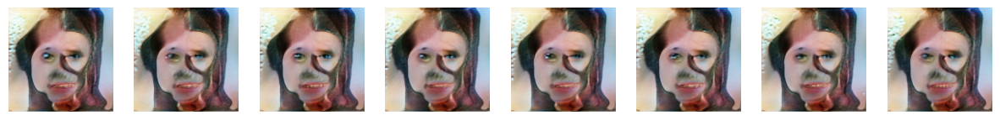

Training images:  18%|█▊        | 300/1625 [04:59<22:58,  1.04s/it]


Epoch [10/10], Step [300/1625], D Loss: 0.2631, G Loss: 1.4898


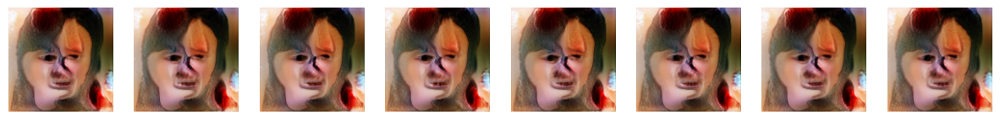

Training images:  37%|███▋      | 600/1625 [10:01<16:26,  1.04it/s]


Epoch [10/10], Step [600/1625], D Loss: 0.1034, G Loss: 3.3966


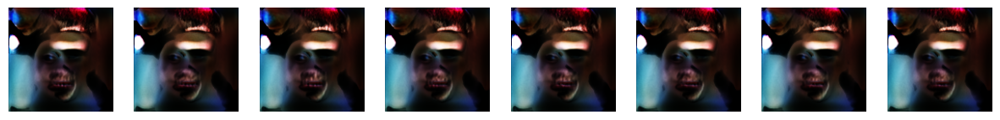

Training images:  42%|████▏     | 676/1625 [11:17<15:37,  1.01it/s]

In [ ]:
# Training Loop

# Define paths for saving and loading
generator_path = "/content/drive/My Drive/StyleGANPrivate Models/generatorLast.pth"
discriminator_path = "/content/drive/My Drive/StyleGANPrivate Models/discriminatorLast.pth"

os.makedirs(os.path.dirname(generator_path), exist_ok=True)
os.makedirs(os.path.dirname(discriminator_path), exist_ok=True)
# Load models if they exist
try:
  # Load models, explicitly mapping to CPU if CUDA is not available
  generator.load_state_dict(torch.load(generator_path, map_location=torch.device('cpu')))
  discriminator.load_state_dict(torch.load(discriminator_path, map_location=torch.device('cpu')))
  print("Loaded existing models from Google Drive.")
except FileNotFoundError:
  print("No pre-trained models found, starting from scratch.")


# Optimizers for both generator and discriminator
optimizer_g = optim.Adam(generator.parameters(), lr=lr, betas=(0.0, 0.99))
optimizer_d = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.0, 0.99))

generator.to(device)
discriminator.to(device)

losses = []

print("-"*50)
print("Start Training")
print("-"*50)
pl_reg_loss = None

# The Training Loop itself
for epoch in range(num_epochs): # ~25 mins per epoch
  for i, (real_images) in tqdm(enumerate(train_loader), total=len(train_loader), desc="Training images"):
    real_images = real_images.to(device)
    generator.zero_grad()
    discriminator.zero_grad()

    # Generate fake images with the generator
    z = torch.randn(batch_size, z_dim).to(device)  # Latent vector z
    fake_images = generator(z)

    # Get discriminator predictions for real and fake images
    fake_output = discriminator(fake_images)
    real_output = discriminator(real_images)
    D_loss, _ = criterion(real_output, fake_output)
    """
    if i % 16 == 0:
      z = torch.randn(batch_size, z_dim).to(device)
      pl_reg_loss = path_length_regularization(generator, z)
      total_G_loss = G_loss + pl_reg_loss
    else:
      total_G_loss = G_loss
    """
    D_loss.backward()
    optimizer_d.step()

    generator.zero_grad()
    z = torch.randn(batch_size, z_dim).to(device)  # Latent vector z
    fake_images = generator(z)
    fake_output = discriminator(fake_images)
    _, G_loss = criterion(real_output, fake_output)
    G_loss.backward()
    optimizer_g.step()

    # Update the losses
    losses.append([epochs_trained, i, D_loss.item(), G_loss.item()])

    # Print the losses
    if i % 300 == 0:  # Print every 250 iterations
      tqdm.write(f"\nEpoch [{epoch+1}/{num_epochs}], Step [{i}/{len(train_loader)}], "
                f"D Loss: {D_loss.item():.4f}, G Loss: {G_loss.item():.4f}")
      # Visualize real and fake images every 250 bathces
      # show_images(real_images, title="Real Images", num_images=8)
      show_images(fake_images, title="Fake Images", num_images=8)



  # Visualize real and fake images at the end
  tqdm.write(f"\nEpoch [{epoch+1}/{num_epochs}], Step [{i}/{len(train_loader)}], "
            f"D Loss: {D_loss.item():.4f}, G Loss: {G_loss.item():.4f}")
  # show_images(real_images, title="Real Images", num_images=8)
  show_images(fake_images, title="Fake Images", num_images=8)
  # Save models after each epoch
  torch.save(generator.state_dict(), generator_path)
  torch.save(discriminator.state_dict(), discriminator_path)
  # Save losses
  save_losses(losses)
  # Keep count of epochs
  save_epoch_num(epochs_trained+1)
  epochs_trained = load_epoch_num()
  print(f"\nModels saved to Google Drive after local epoch {epoch+1}\n")
  print("-"*50)
  print("-"*50)
  print(f"The model was trained over {epochs_trained} epochs by now")
  print("-"*50)
  print("-"*50)
  print()


# Plot Loss Evaluation

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/StyleGAN Models/final_gan_losses.csv')
checkpoint_df = df[(df["Batches"] % 250==0) | (df["Batches"]==1)]
epochs_df = df[(df["Batches"] % 3250==0)]

## Plot G_loss and D_loss for **all batches**

In [ ]:
plt.figure(figsize=(10, 5))

# Plot G_loss
plt.plot(df["global_epoch"], df["G_loss"], label="G_loss", marker="o", linestyle="-")

# Plot D_loss
plt.plot(df["global_epoch"], df["D_loss"], label="D_loss", marker="s", linestyle="-")

# Labels and title
plt.xlabel("Global Epoch")
plt.ylabel("Loss Value")
plt.title("All G_loss and D_loss Over Global Epochs")
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

NameError: name 'df' is not defined

<Figure size 1000x500 with 0 Axes>

## Plot G_loss and D_loss for **every 250 batches**

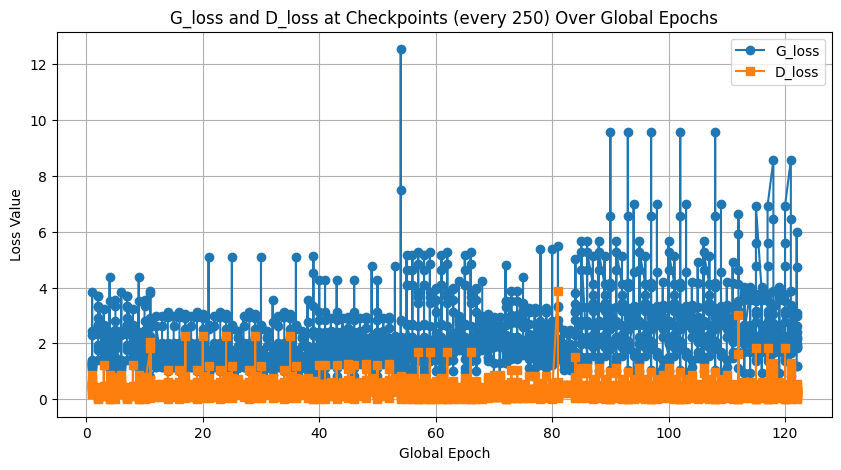

In [ ]:
plt.figure(figsize=(10, 5))

# Plot G_loss
plt.plot(checkpoint_df["global_epoch"], checkpoint_df["G_loss"], label="G_loss", marker="o", linestyle="-")

# Plot D_loss
plt.plot(checkpoint_df["global_epoch"], checkpoint_df["D_loss"], label="D_loss", marker="s", linestyle="-")

# Labels and title
plt.xlabel("Global Epoch")
plt.ylabel("Loss Value")
plt.title("G_loss and D_loss at Checkpoints (every 250) Over Global Epochs")
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

## Plot G_loss and D_loss for **averages over batches** - The only clear one

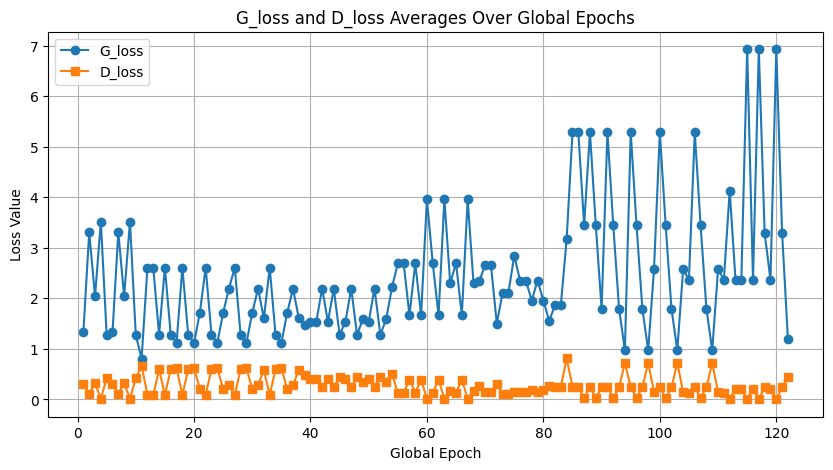

In [ ]:
plt.figure(figsize=(10, 5))

# Plot G_loss
plt.plot(epochs_df["global_epoch"], epochs_df["G_loss"], label="G_loss", marker="o", linestyle="-")

# Plot D_loss
plt.plot(epochs_df["global_epoch"], epochs_df["D_loss"], label="D_loss", marker="s", linestyle="-")

# Labels and title
plt.xlabel("Global Epoch")
plt.ylabel("Loss Value")
plt.title("G_loss and D_loss Averages Over Global Epochs")
plt.legend()
plt.grid(True)

# Show the plot
plt.show()